# imports

In [1]:
from tools import *
%load_ext autoreload
%autoreload explicit
%aimport tools
%aimport tools_highdim

In [2]:
from tools_highdim import *

execute for interactive plots:

(for new plots to appear in their own window, call `plt.close()` after every plot)

In [ ]:
%matplotlib widget

In [3]:
catalog_2RXS_core = np.load("catalog_2RXS_core.npy")

# AGN data in higher dimensions

cluster in > 2 dimensions and visualize in 2 dimensions (e.g. WISE standard plot)

## WISE standard plot + x-ray

In [11]:
data = np.array([catalog_2RXS_core['W2'] - catalog_2RXS_core['W3'], catalog_2RXS_core['W1'] - catalog_2RXS_core['W2'], np.log10(catalog_2RXS_core['Flux'])])

In [18]:
data.shape

(3, 106569)

--> 3 dimensions

### plots

Text(0, 0.5, 'W1 - W2')

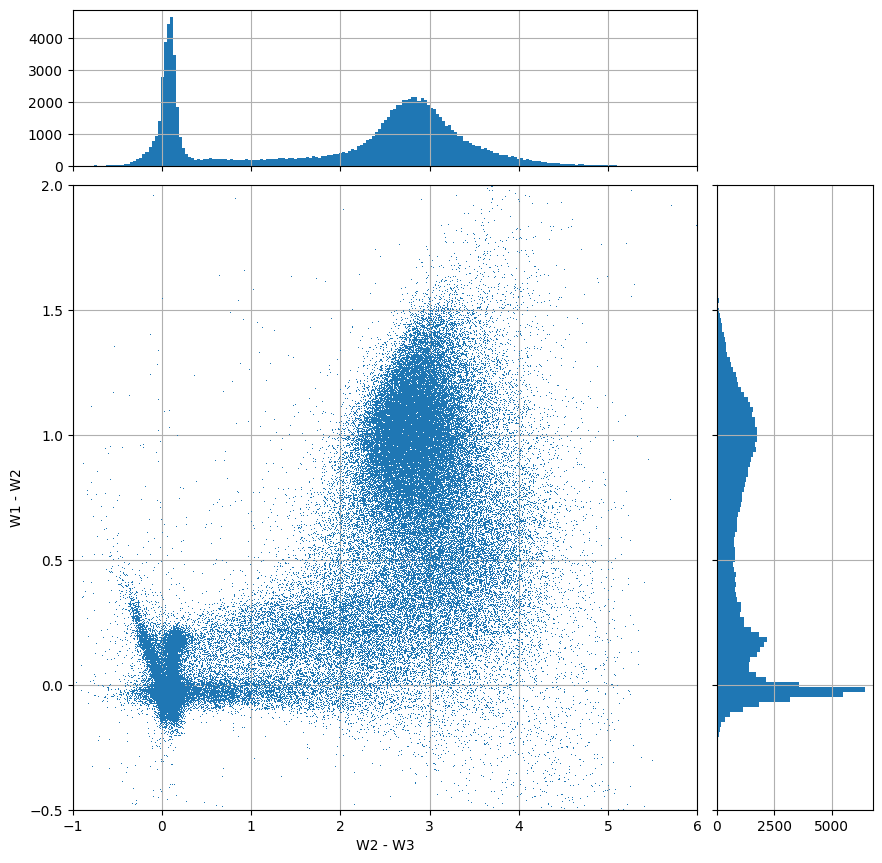

In [12]:
ax, plot2d, histx, histy = plot_with_marginals(data[0], data[1])
histx(bins=400)
histy(bins=600)
ax.set_xlim(-1, 6)
ax.set_ylim(-0.5, 2)
ax.set_xlabel("W2 - W3")
ax.set_ylabel("W1 - W2")

Text(0, 0.5, 'W1 - W2')

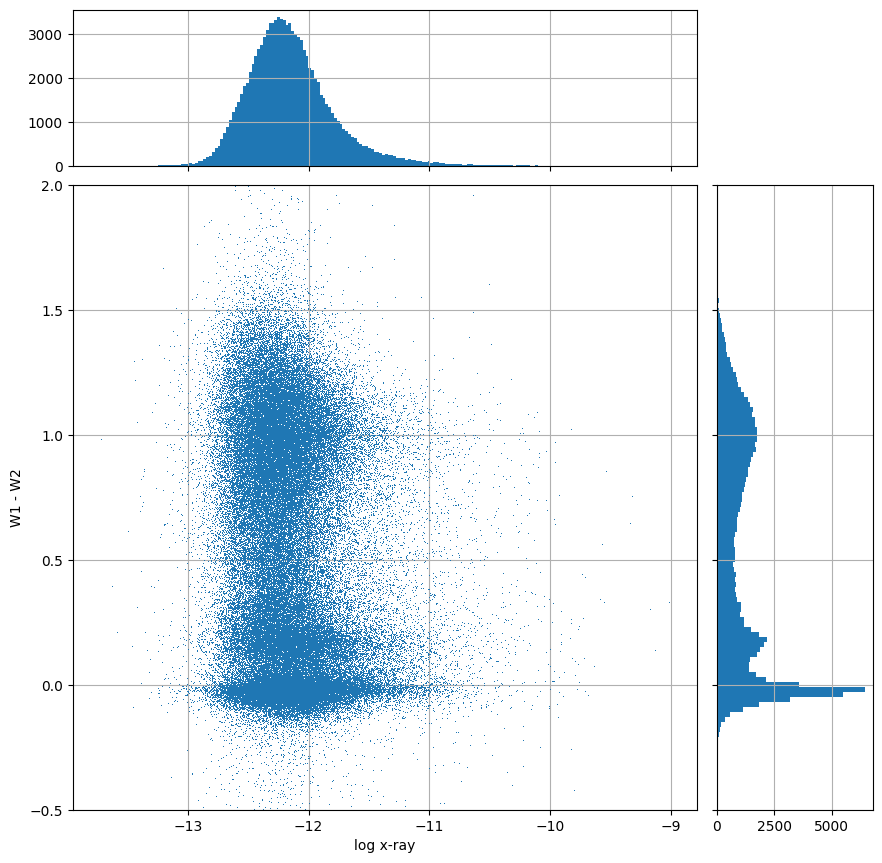

In [13]:
ax, plot2d, histx, histy = plot_with_marginals(data[2], data[1])
histx(bins=200)
histy(bins=600)
ax.set_ylim(-0.5, 2)
ax.set_xlabel("log x-ray")
ax.set_ylabel("W1 - W2")

Text(0, 0.5, 'log x-ray')

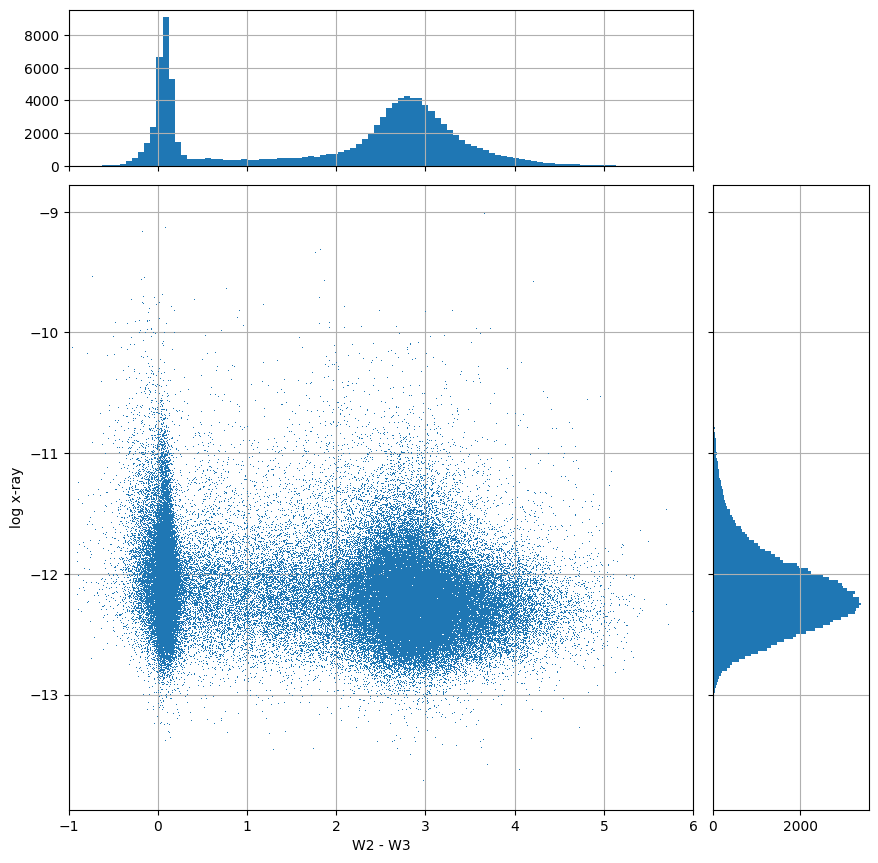

In [14]:
ax, plot2d, histx, histy = plot_with_marginals(data[0], data[2])
histx(bins=200)
histy(bins=200)
ax.set_xlim(-1, 6)
ax.set_xlabel("W2 - W3")
ax.set_ylabel("log x-ray")

distribution in two parts:

Text(0, 0.5, 'log x-ray')

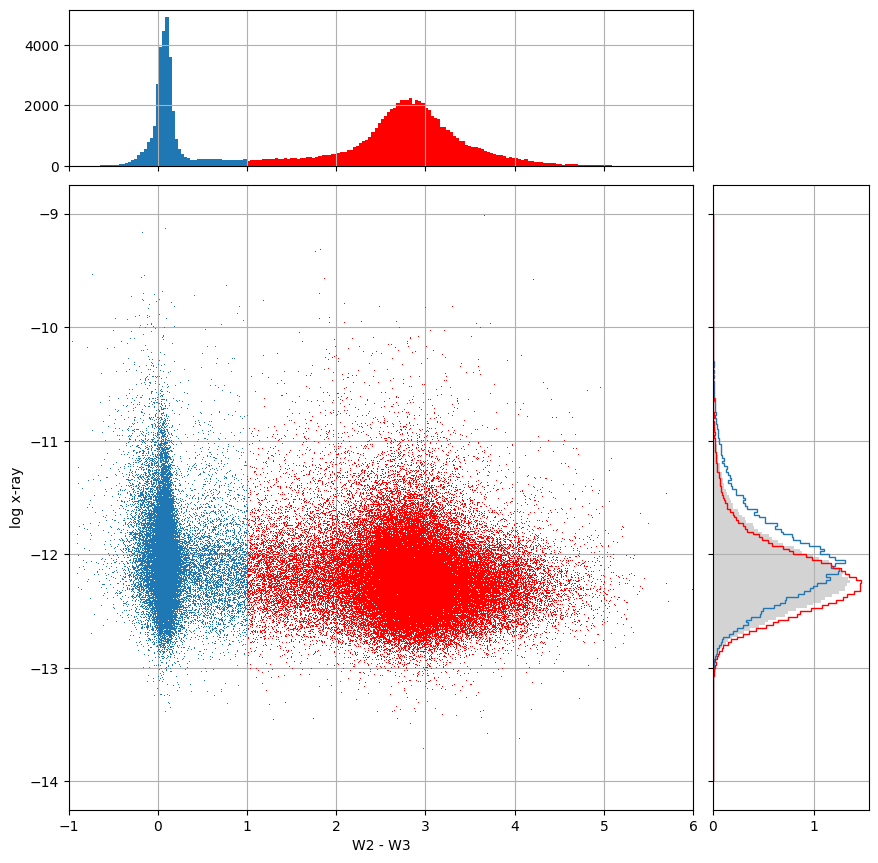

In [16]:
x, y = data[0], data[2]
figsize=(10, 10)

fig = plt.figure(figsize=figsize)
gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4), left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.05, hspace=0.05)
ax = fig.add_subplot(gs[1, 0])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)

# no labels
ax_histx.tick_params(axis="x", labelbottom=False)
ax_histy.tick_params(axis="y", labelleft=False)

# remove NaNs for histogramming
x, y = no_nan(x, y)


cut_mask = x < 1


ax.clear()
ax.plot(x[cut_mask], y[cut_mask], ',');
ax.plot(x[~cut_mask], y[~cut_mask], ',r');

# x marginalization (above)
ax_histx.clear()
ax_histx.hist(x[cut_mask], bins=200, range=[-1, 6]);
ax_histx.hist(x[~cut_mask], bins=200, range=[-1, 6], color='red');

# y marginalisation (right)
ax_histy.clear()
ax_histy.hist(y, orientation='horizontal', bins=200, range=[-14, -9], density=True, color='lightgrey');
ax_histy.hist(y[cut_mask], orientation='horizontal', bins=200, range=[-14, -9], density=True, histtype='step');
ax_histy.hist(y[~cut_mask], orientation='horizontal', bins=200, range=[-14, -9], density=True, histtype='step', color='red');

ax.set_xlim(-1, 6)
ax.set_xlabel("W2 - W3")
ax.set_ylabel("log x-ray")

### clustering

Found 3 clusters


(-0.5, 2.0)

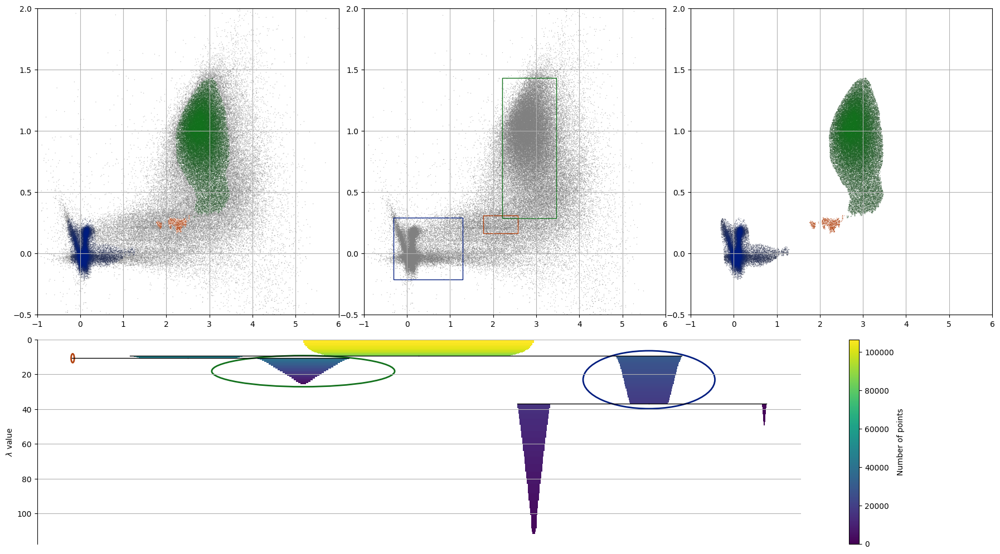

In [17]:
do_cluster(data[:2], min_cluster_size=500)
plt.xlim(-1, 6)
plt.ylim(-0.5, 2)

Found 2 clusters
Using only first two dimensions for plotting


(-0.5, 2.0)

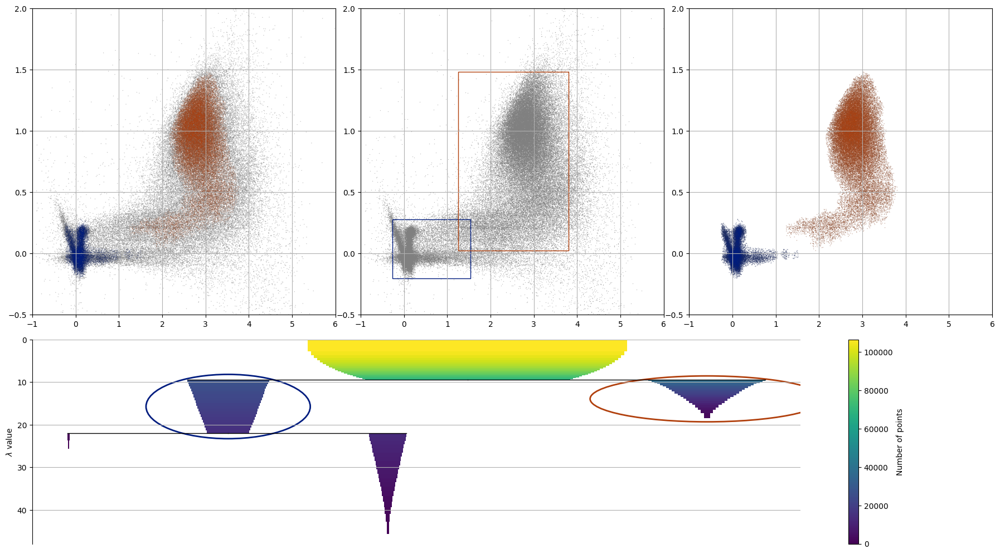

In [19]:
do_cluster(data, min_cluster_size=100)
plt.xlim(-1, 6)
plt.ylim(-0.5, 2)

Found 3 clusters
Using only first two dimensions for plotting


(-0.5, 2.0)

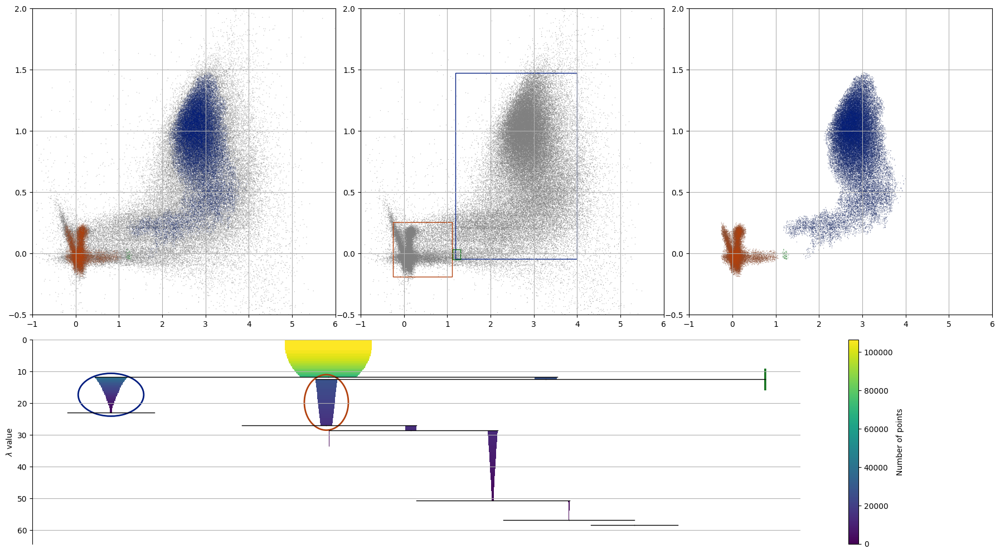

In [20]:
do_cluster(data, min_cluster_size=50)
plt.xlim(-1, 6)
plt.ylim(-0.5, 2)

Found 2 clusters


(-1.0, 6.0)

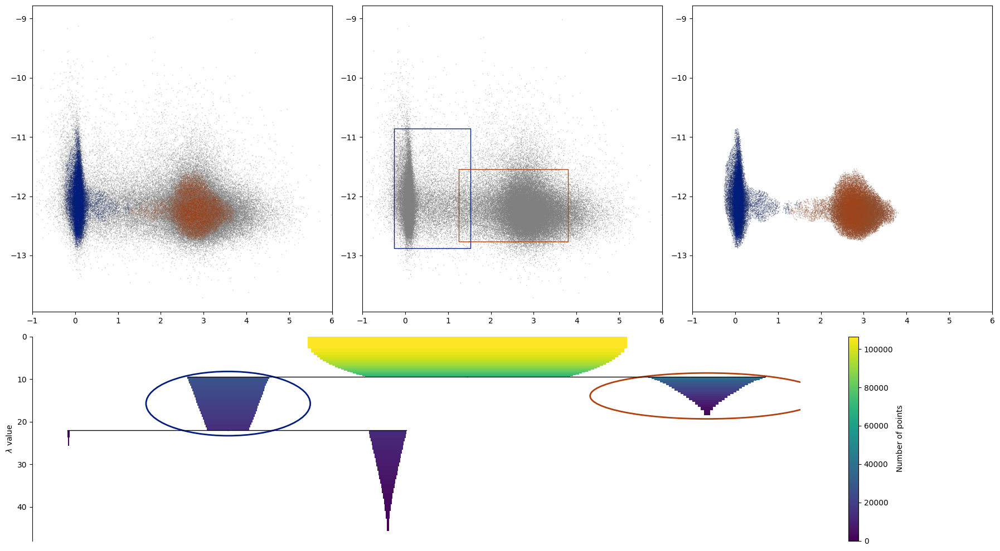

In [ ]:
do_cluster([data[0], data[2], data[1]], min_cluster_size=100)
plt.xlim(-1, 6)

Found 2 clusters


(-0.5, 2.0)

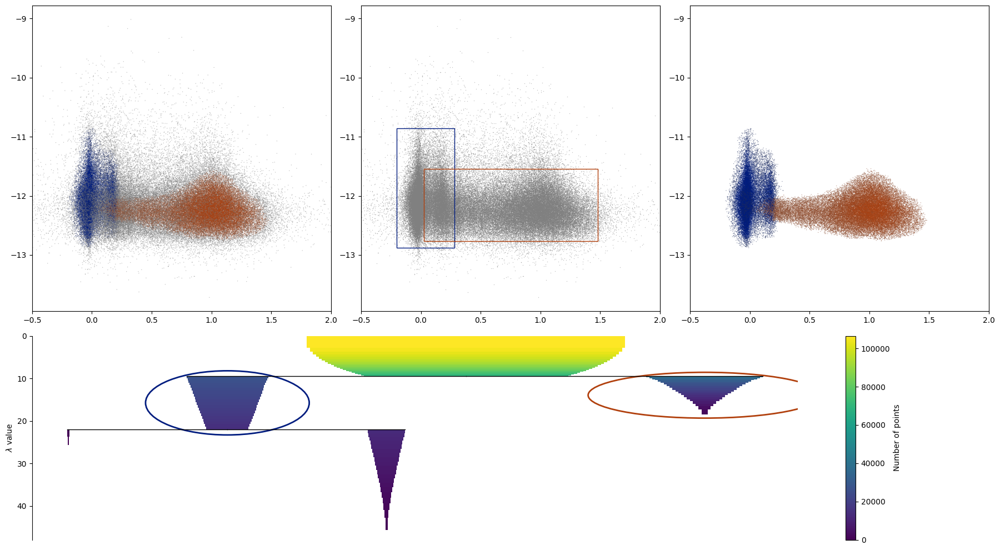

In [ ]:
do_cluster([data[1], data[2], data[0]], min_cluster_size=100)
plt.xlim(-0.5, 2)

## W1 to W4 + x-ray (5 dim)

In [4]:
data = np.array([catalog_2RXS_core['W1'], catalog_2RXS_core['W2'], catalog_2RXS_core['W3'], catalog_2RXS_core['W4'], np.log10(catalog_2RXS_core['Flux'])]).T

In [44]:
data.shape

(106569, 5)

### first test with corner plot

corner plot using corner package!

/home/basti/Documents/Uni/PhD/Workspace/ipynb/tools.py:16: UserWarning: Interpreting 2-dimensional array as multiple inputs instead of flattening array.
  warnings.warn("Interpreting 2-dimensional array as multiple inputs instead of flattening array.")


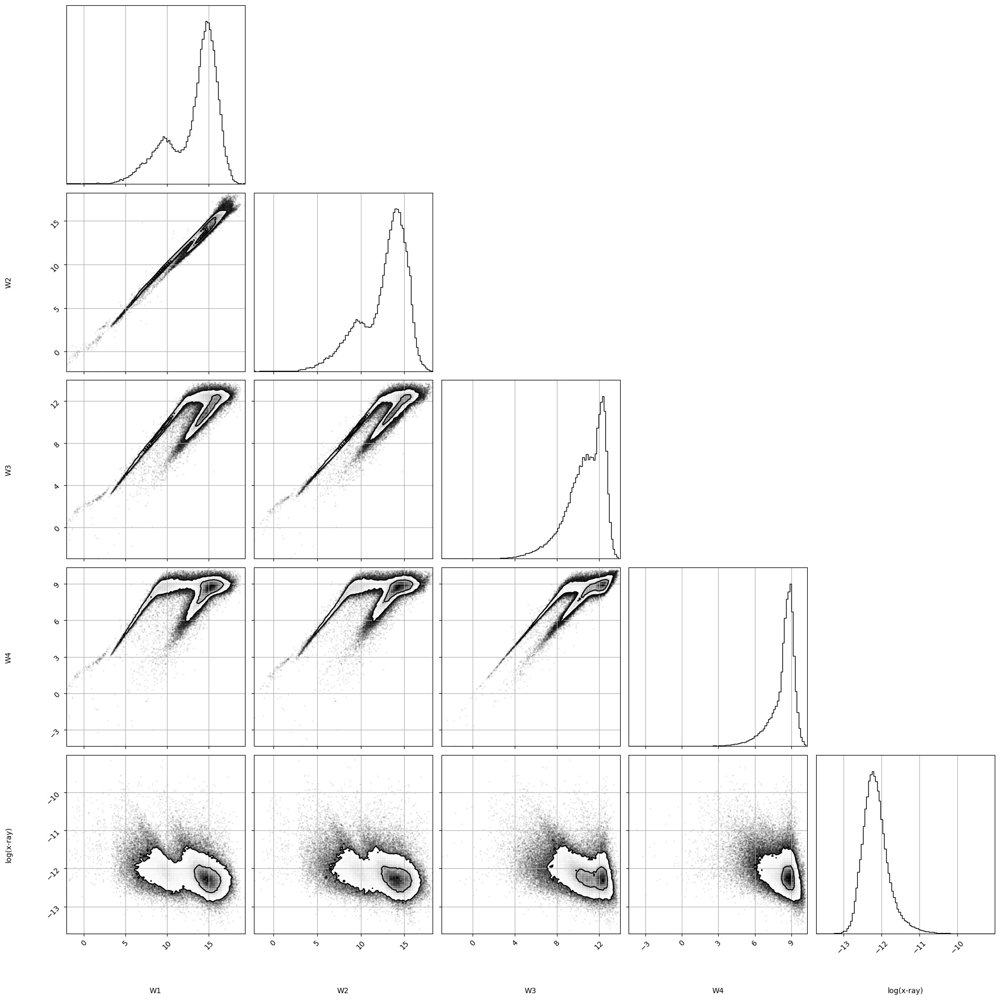

In [7]:
fig = corner.corner(no_nan(data), levels=(1 - np.exp(-0.5), 1 - np.exp(-2)), bins=100, labels=('W1', 'W2', 'W3', 'W4', 'log(x-ray)'), fig=plt.figure(figsize=(20, 20)));

for cluster results without contours:

Found 2 clusters


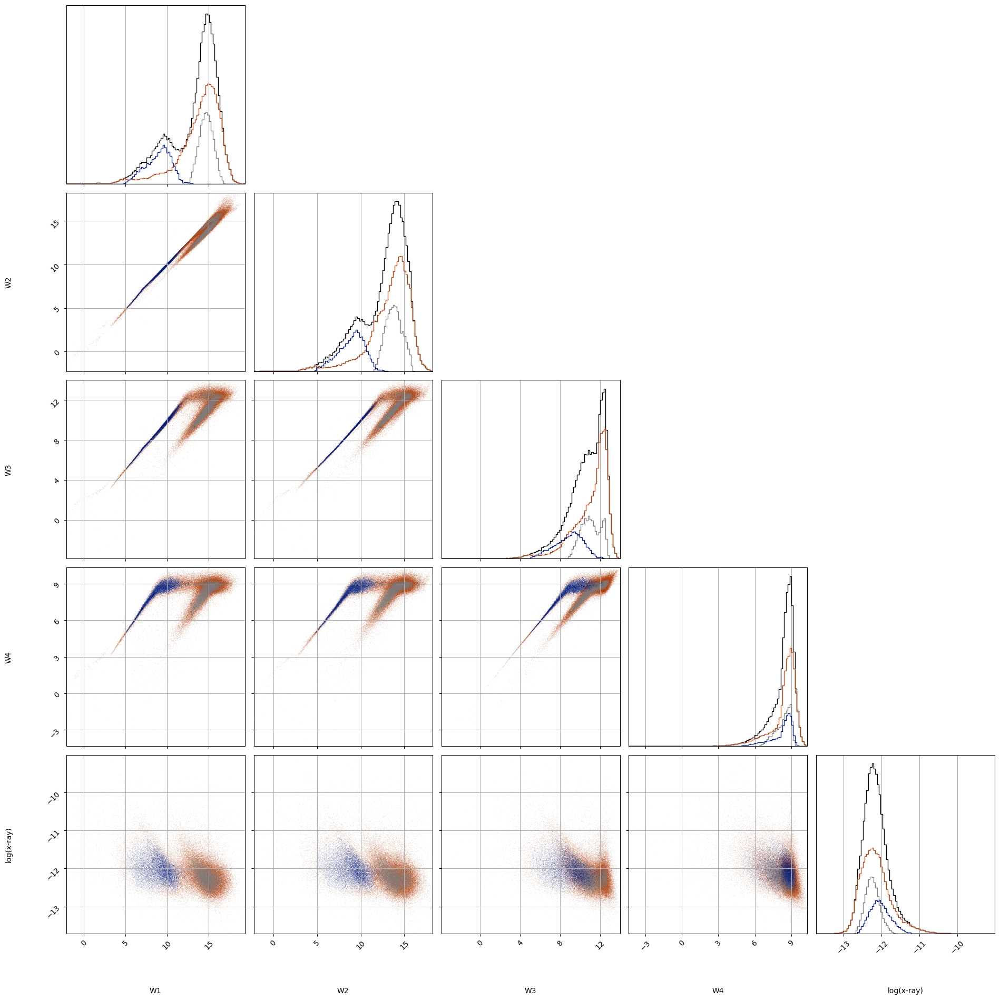

In [16]:
with warnings.catch_warnings():
	warnings.filterwarnings('ignore', module='tools')
	cluster_corner(data, ('W1', 'W2', 'W3', 'W4', 'log(x-ray)'), min_cluster_size=50)

Found 2 clusters


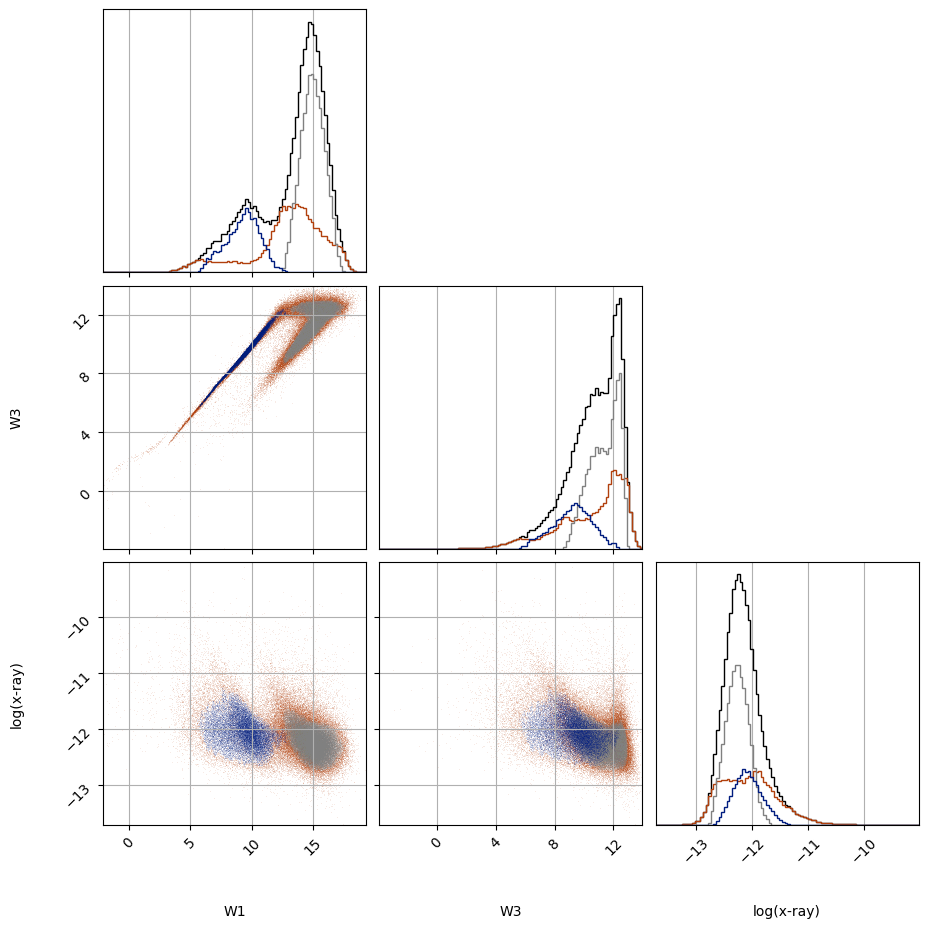

In [20]:
with warnings.catch_warnings():
	warnings.filterwarnings('ignore', module='tools')
	cluster_corner(data[:,0::2], ('W1', 'W3', 'log(x-ray)'), plt.figure(figsize=(10,10)), min_cluster_size=50)

--> clustering is weird: it clearly finds points as unclustered which are right inside another cluster (easily visible with dimensions reduced to 3)

Found 5 clusters


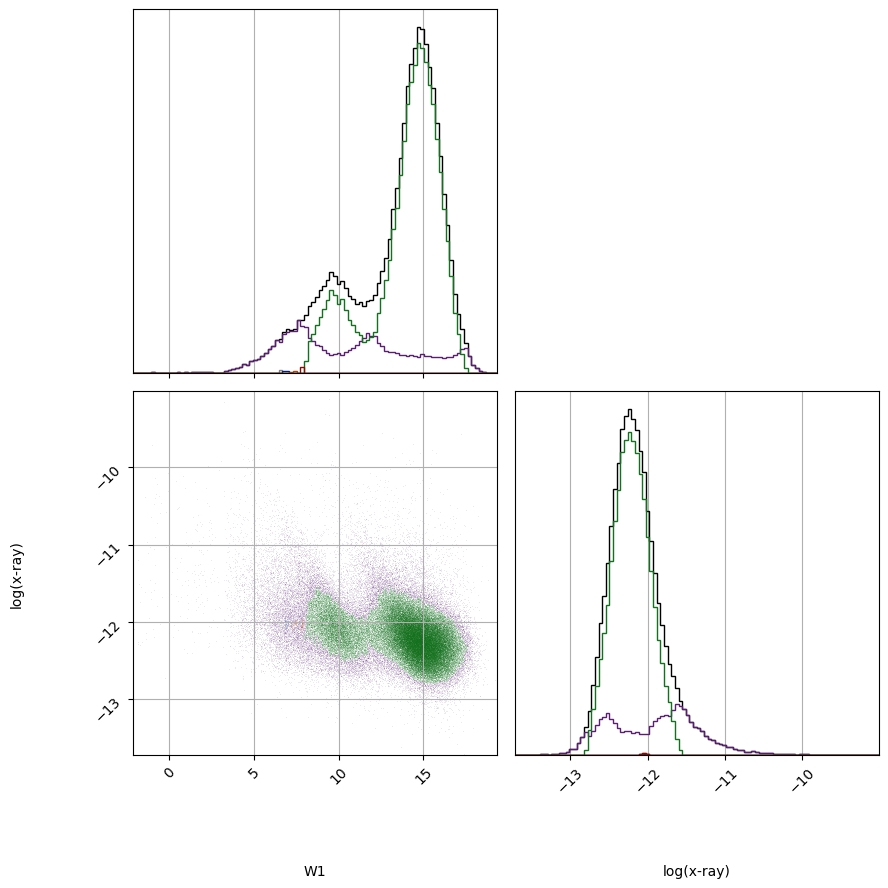

In [21]:
with warnings.catch_warnings():
	warnings.filterwarnings('ignore', module='tools')
	cluster_corner(data[:,::4], ('W1', 'log(x-ray)'), plt.figure(figsize=(10,10)), min_cluster_size=50)

--> with just 2 dimensions this does not happen, but it selects one cluster wrapping around the other, which is unintuitive?

### play with hyperparameter

In [29]:
range_MCS = list(range(10, 200, 10)) + list(range(200, 1100, 100))

In [33]:
for min_cluster_size in range_MCS:
	with warnings.catch_warnings():
		warnings.filterwarnings('ignore', module='tools')		
		filename = "corner5D_min_cluster_size-%d.png" % min_cluster_size
		print(filename)

		cluster_corner(data, ('W1', 'W2', 'W3', 'W4', 'log(x-ray)'), min_cluster_size=min_cluster_size)
		plt.savefig("../HDBScan_scan/corner/" + filename)
		plt.close()

corner5D_min_cluster_size-10.png
Found 4 clusters
corner5D_min_cluster_size-20.png
Found 2 clusters
corner5D_min_cluster_size-30.png
Found 2 clusters
corner5D_min_cluster_size-40.png
Found 2 clusters
corner5D_min_cluster_size-50.png
Found 2 clusters
corner5D_min_cluster_size-60.png
Found 2 clusters
corner5D_min_cluster_size-70.png
Found 2 clusters
corner5D_min_cluster_size-80.png
Found 2 clusters
corner5D_min_cluster_size-90.png
Found 2 clusters
corner5D_min_cluster_size-100.png
Found 2 clusters
corner5D_min_cluster_size-110.png
Found 2 clusters
corner5D_min_cluster_size-120.png
Found 2 clusters
corner5D_min_cluster_size-130.png
Found 2 clusters
corner5D_min_cluster_size-140.png
Found 2 clusters
corner5D_min_cluster_size-150.png
Found 2 clusters
corner5D_min_cluster_size-160.png
Found 2 clusters
corner5D_min_cluster_size-170.png
Found 2 clusters
corner5D_min_cluster_size-180.png
Found 2 clusters
corner5D_min_cluster_size-190.png
Found 2 clusters
corner5D_min_cluster_size-200.png
Found 

In [7]:
range_MCS = [100, 200]
range_MS = list(range(10, 200, 10))

for min_samples in range_MS:
	for min_cluster_size in range_MCS:
		with warnings.catch_warnings():
			warnings.filterwarnings('ignore', module='tools')		
			filename = "corner5D_scan2_min_samples-%d_min_cluster_size-%d.png" % (min_samples, min_cluster_size)
			print(filename)

			cluster_corner(data, ('W1', 'W2', 'W3', 'W4', 'log(x-ray)'), min_cluster_size=min_cluster_size, min_samples=min_samples)
			plt.savefig("../HDBScan_scan/corner/" + filename)
			plt.close()

corner5D_scan2_min_samples-10_min_cluster_size-100.png
Found 2 clusters
corner5D_scan2_min_samples-10_min_cluster_size-200.png
Found 2 clusters
corner5D_scan2_min_samples-20_min_cluster_size-100.png
Found 2 clusters
corner5D_scan2_min_samples-20_min_cluster_size-200.png
Found 2 clusters
corner5D_scan2_min_samples-30_min_cluster_size-100.png
Found 2 clusters
corner5D_scan2_min_samples-30_min_cluster_size-200.png
Found 2 clusters
corner5D_scan2_min_samples-40_min_cluster_size-100.png
Found 2 clusters
corner5D_scan2_min_samples-40_min_cluster_size-200.png
Found 2 clusters
corner5D_scan2_min_samples-50_min_cluster_size-100.png
Found 2 clusters
corner5D_scan2_min_samples-50_min_cluster_size-200.png
Found 2 clusters
corner5D_scan2_min_samples-60_min_cluster_size-100.png
Found 2 clusters
corner5D_scan2_min_samples-60_min_cluster_size-200.png
Found 2 clusters
corner5D_scan2_min_samples-70_min_cluster_size-100.png
Found 2 clusters
corner5D_scan2_min_samples-70_min_cluster_size-200.png
Found 2 c

## using S&S's data

In [4]:
import pandas as pd
SnS = pd.read_pickle("../2RXS_XMMSL2_AGN_before_classification.pkl")

(<Axes: >,
 <function tools_highdim.plot_with_marginals.<locals>.plot_ax(**kwargs)>,
 <function tools_highdim.plot_with_marginals.<locals>.plot_histx(**kwargs)>,
 <function tools_highdim.plot_with_marginals.<locals>.plot_histy(**kwargs)>)

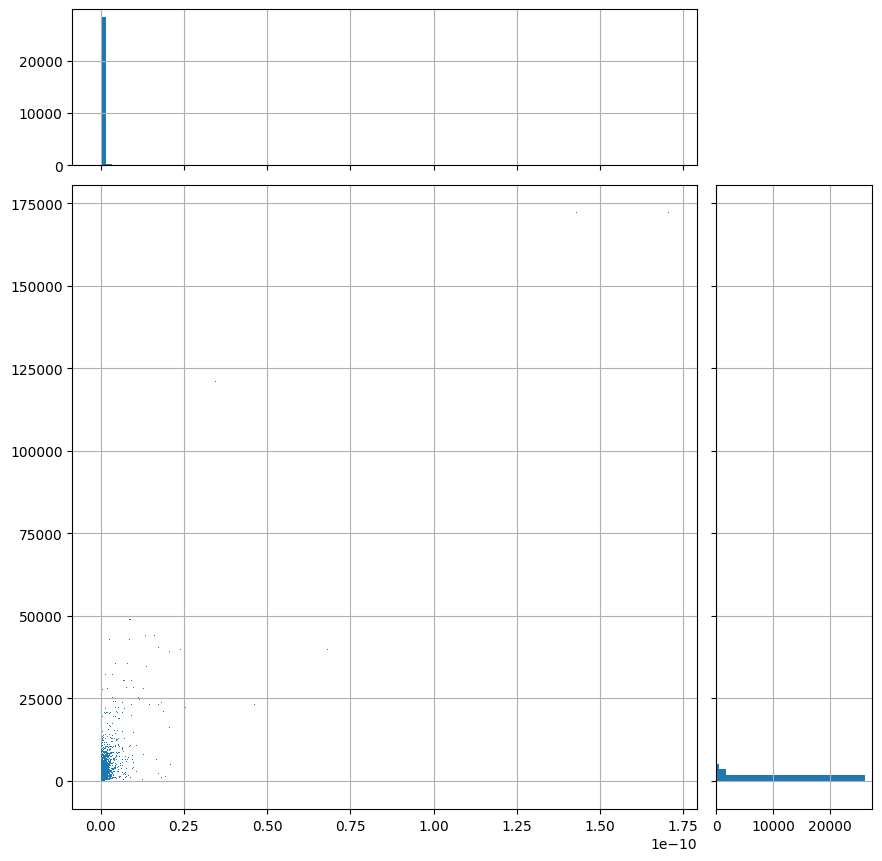

In [10]:
plot_with_marginals(SnS['Flux'], SnS['Gaia mean flux'])

(<Axes: >,
 <function tools_highdim.plot_with_marginals.<locals>.plot_ax(**kwargs)>,
 <function tools_highdim.plot_with_marginals.<locals>.plot_histx(**kwargs)>,
 <function tools_highdim.plot_with_marginals.<locals>.plot_histy(**kwargs)>)

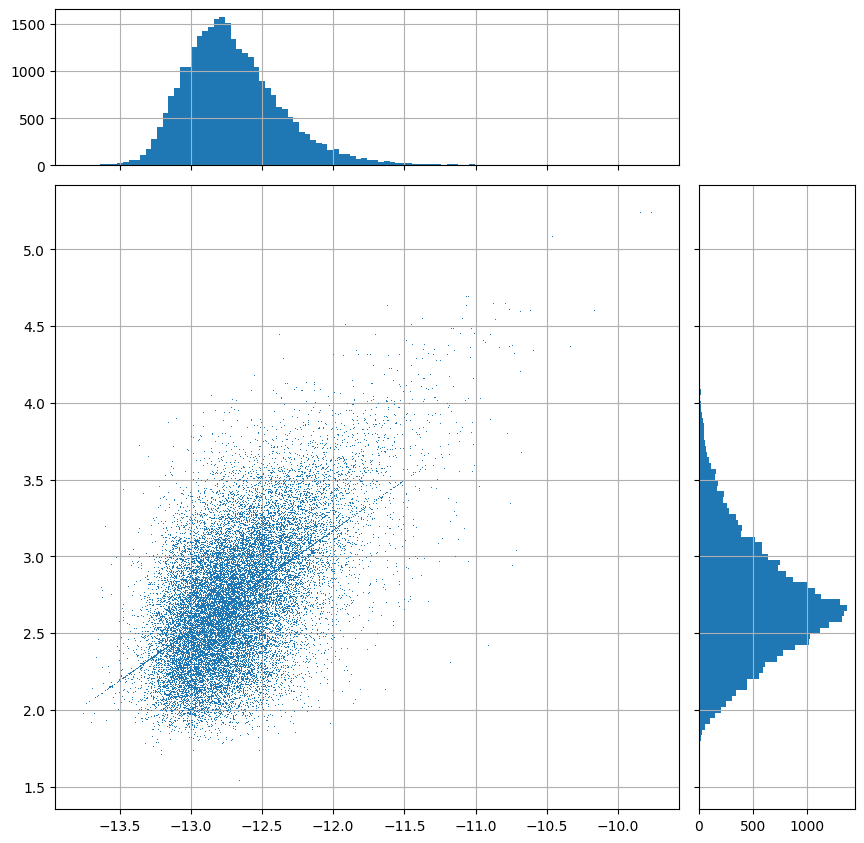

In [ ]:
plot_with_marginals(np.log10(SnS['Flux']), np.log10(SnS['Gaia mean flux']))

In [4]:
data_sns5 = np.array([SnS['W1'], SnS['W2'], SnS['W3'], SnS['W4'], np.log10(SnS['Flux'])]).T

Found 2 clusters


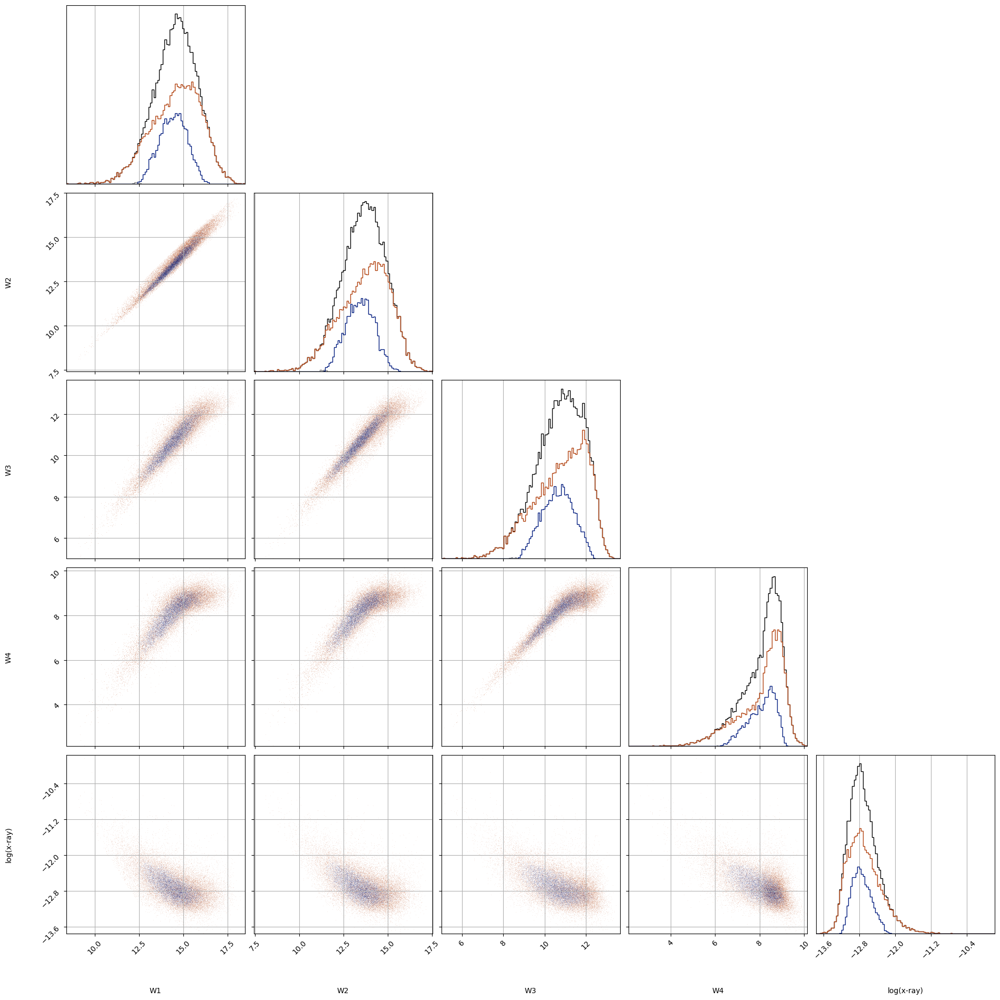

In [15]:
with warnings.catch_warnings():
	warnings.filterwarnings('ignore', module='tools')
	cluster_corner(data_sns5, ('W1', 'W2', 'W3', 'W4', 'log(x-ray)'), min_cluster_size=20)

In [8]:
data_sns11 = np.array([SnS['W1'], SnS['W2'], SnS['W3'], SnS['W4'], np.log10(SnS['Flux']), np.log10(SnS['Gaia mean flux']), SnS['u'], SnS['g'], SnS['r'], SnS['i'], SnS['z']]).T
labels_sns11 = ('W1', 'W2', 'W3', 'W4', 'log(x-ray)', 'log(Gaia)', 'u', 'g', 'r', 'i', 'z')

Found 2 clusters


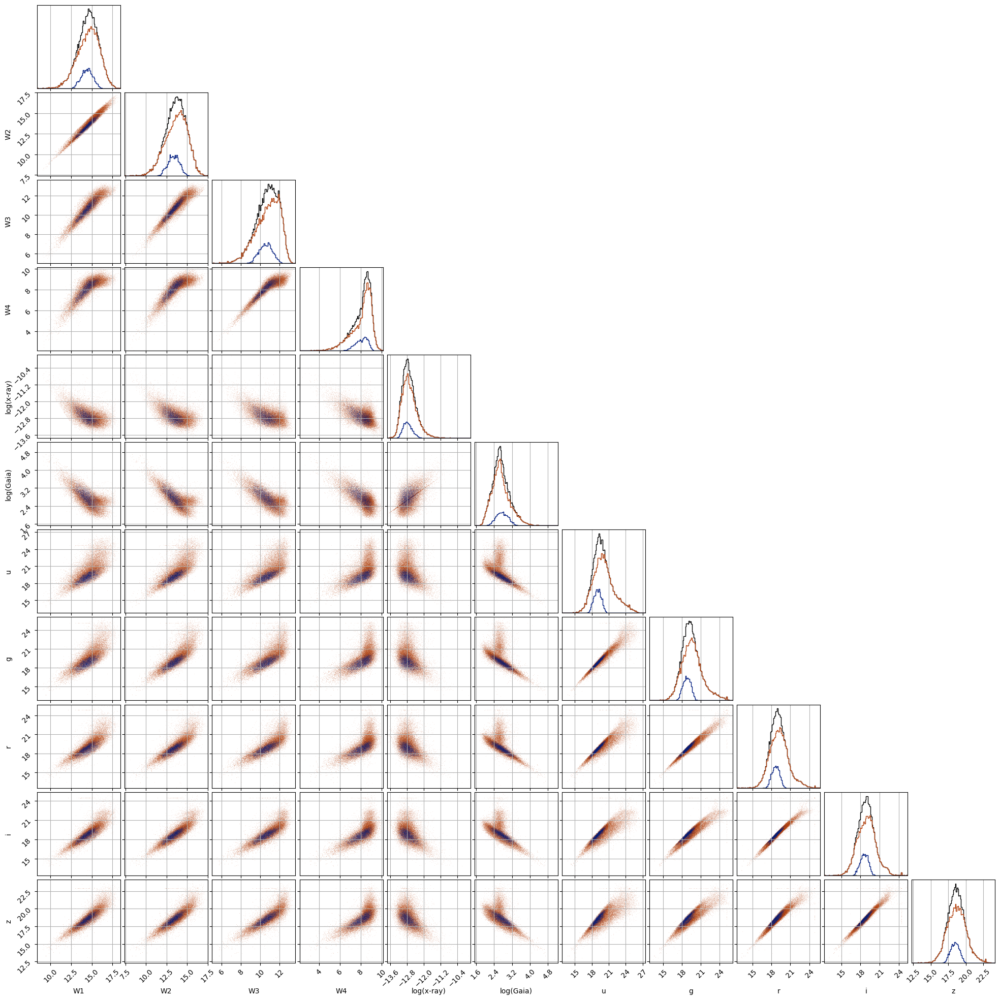

In [9]:
with warnings.catch_warnings():
	warnings.filterwarnings('ignore', module='tools')
	cluster_corner(data_sns11, labels_sns11, min_cluster_size=20)

In [6]:
data_sns18 = np.array([SnS['W1'], SnS['W2'], SnS['W3'], SnS['W4'], np.log10(SnS['Flux']), np.log10(SnS['Gaia mean flux']), SnS['u'], SnS['g'], SnS['r'], SnS['i'], SnS['z'], SnS['W1-W2'], SnS['W2-W3'], SnS['W3-W4'], SnS['u-r'], SnS['g-r'], SnS['r-i'], SnS['i-z']]).T
labels_sns18 = ('W1', 'W2', 'W3', 'W4', 'log(x-ray)', 'log(Gaia)', 'u', 'g', 'r', 'i', 'z', 'W1-W2', 'W2-W3', 'W3-W4', 'u-r', 'g-r', 'r-i', 'i-z')

Found 2 clusters


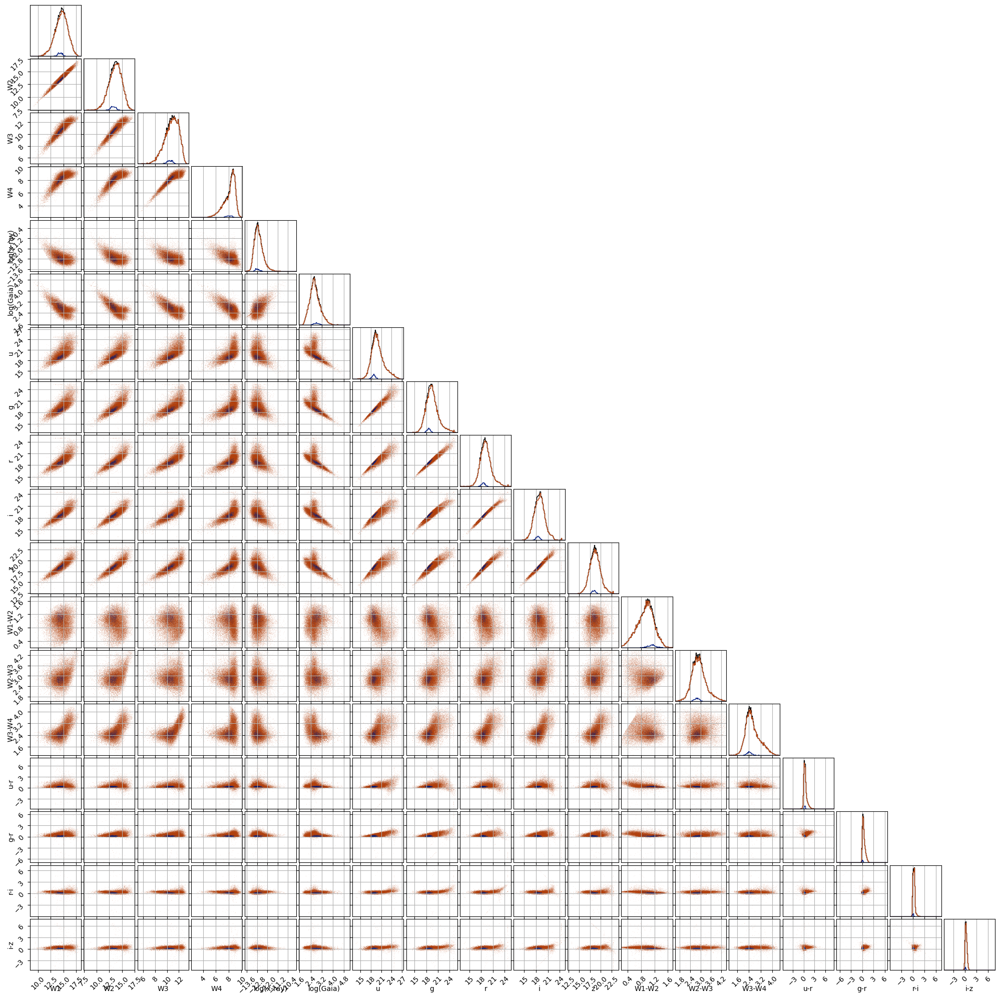

In [7]:
with warnings.catch_warnings():
	warnings.filterwarnings('ignore', module='tools')
	cluster_corner(data_sns18, labels_sns18, min_cluster_size=30)

Found 2 clusters


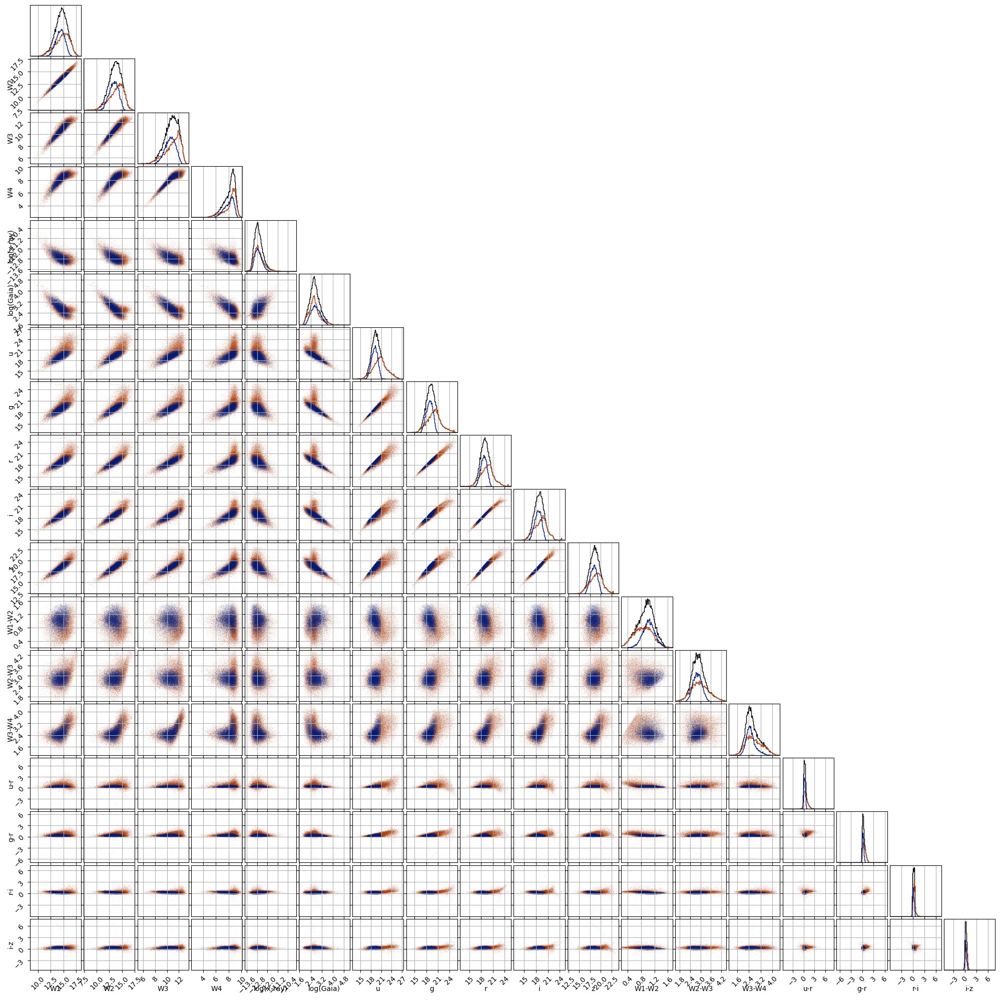

In [10]:
with warnings.catch_warnings():
	warnings.filterwarnings('ignore', module='tools')
	cluster_corner(data_sns18, labels_sns18, min_cluster_size=20)

Found 4 clusters


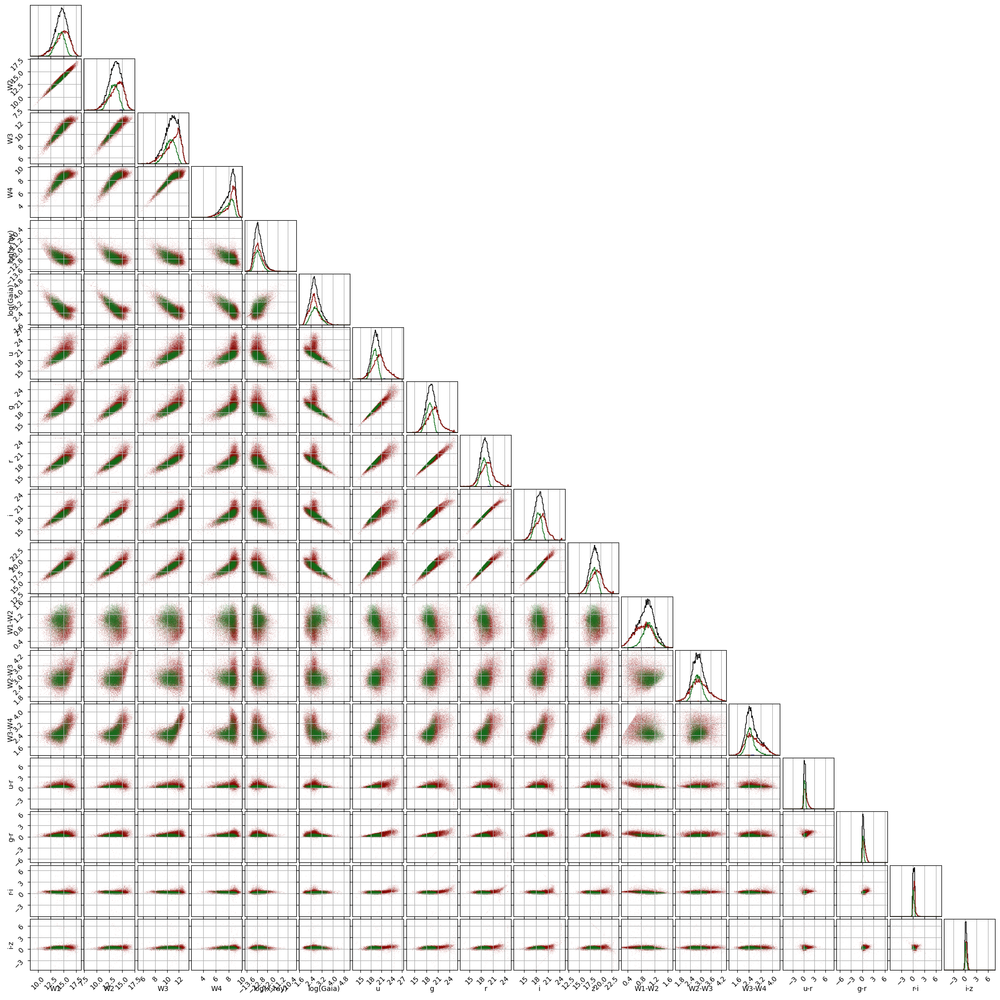

In [19]:
with warnings.catch_warnings():
	warnings.filterwarnings('ignore', module='tools')
	cluster_corner(data_sns18, labels_sns18, min_cluster_size=10)

Using corner plot type.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.


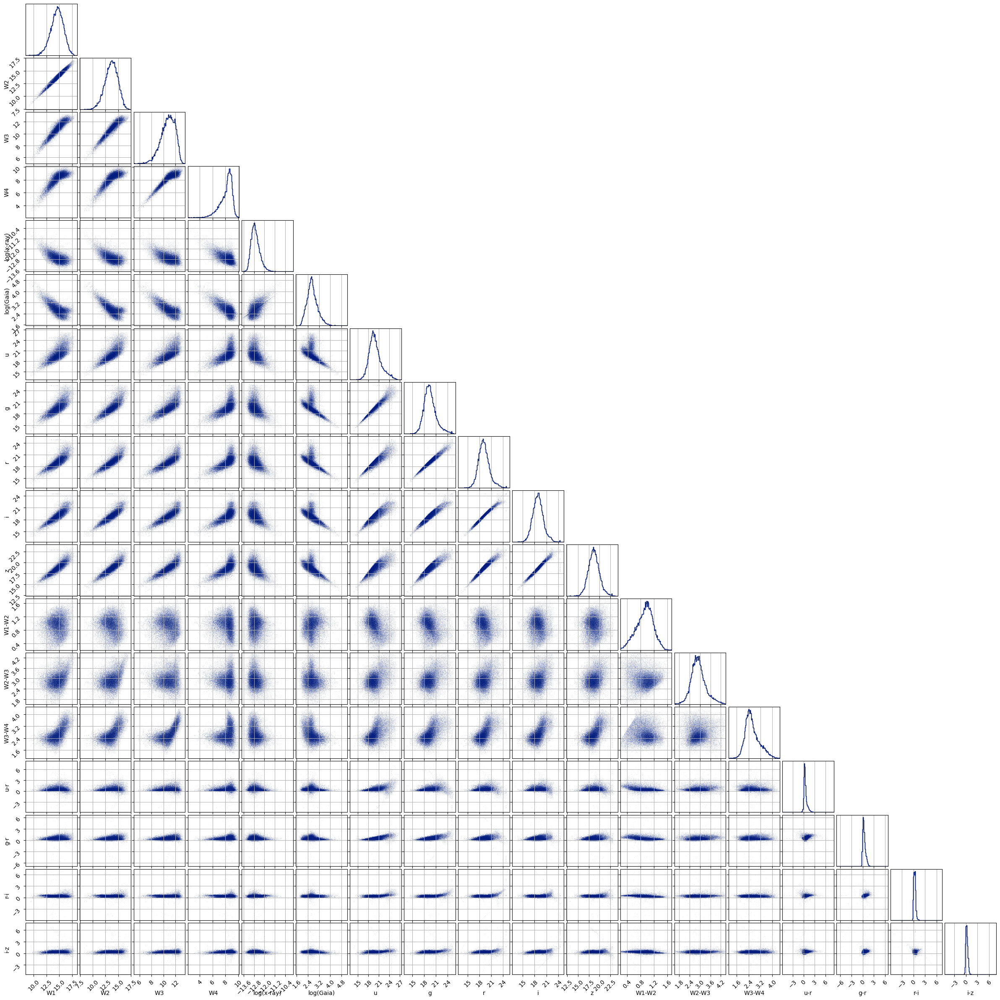

In [7]:
plot_highdim(data_sns18, labels=labels_sns18)

Found 4 clusters:
 cluster -1: 17651 entries (61.00 %)
 cluster 0: 23 entries (0.08 %)
 cluster 1: 16 entries (0.06 %)
 cluster 2: 11 entries (0.04 %)
 cluster 3: 11233 entries (38.82 %)
Using corner plot type.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.
Padded data in cluster 1 to circumvent assertion error.
Padded data in cluster 1 to circumvent assertion error.
Padded data in cluster 1 to circumvent assertion error.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.
Padded data in cluster 2 to circumvent assertion error.
Padded data in cluster 2 to circumvent assertion error.
Padded data in cluster 2 to circumvent assertion error.
Padded data in cluster 2 to circumvent assertion

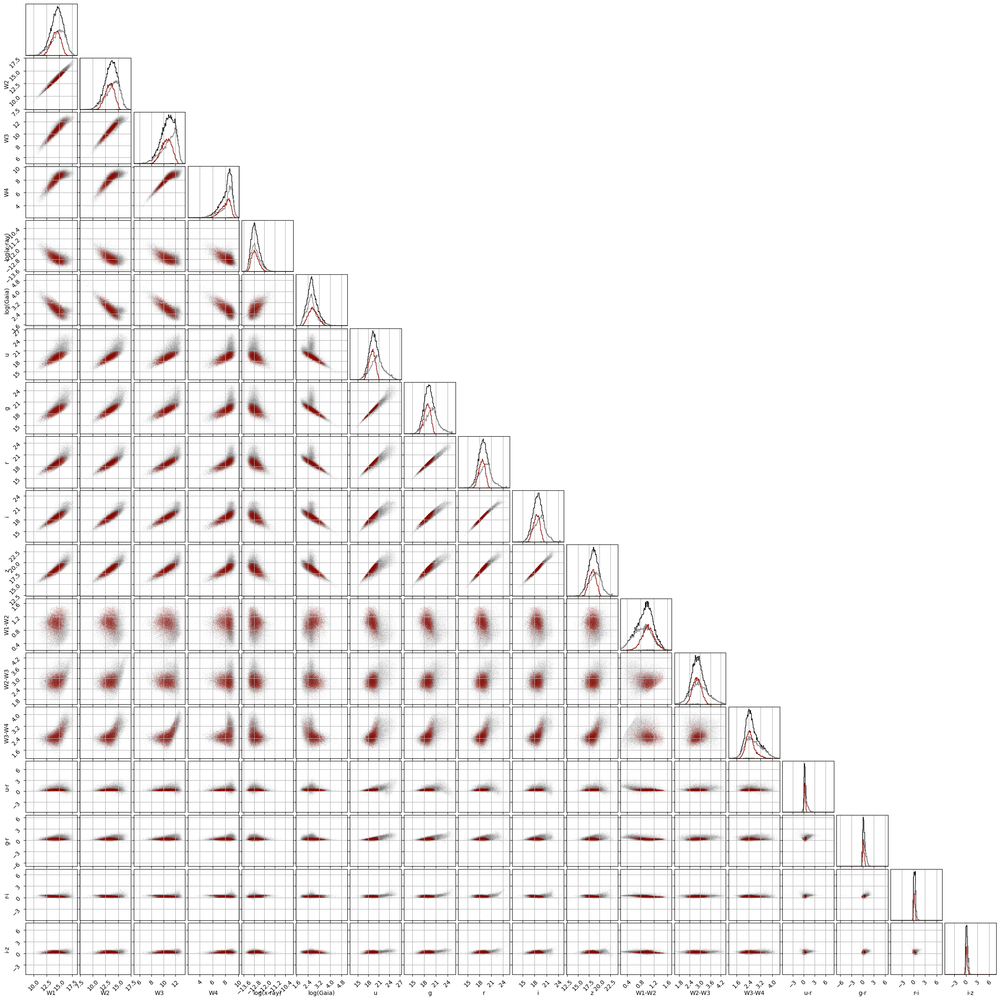

In [10]:
plot_highdim(*do_clustering(data_sns18, min_cluster_size=10), labels=labels_sns18)

Running UMAP...
Interpreting 2-dimensional array as multiple inputs instead of flattening array.
Interpreting 2-dimensional array as multiple inputs instead of flattening array.


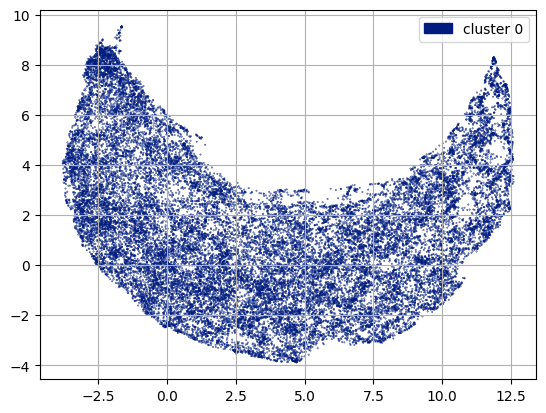

In [12]:
plot_highdim(data_sns18, plot_type='umap')

In [ ]:
plot_highdim()

In [7]:
data_sns18.shape

(28934, 18)

In [5]:
import umap
reducer = umap.UMAP()
embedding = reducer.fit_transform(data_sns18)

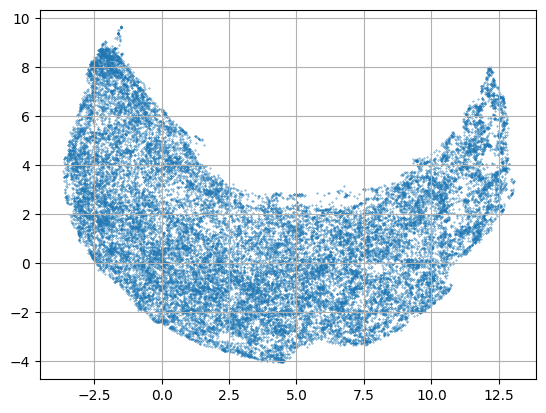

In [6]:
plt.scatter(embedding.T[0], embedding.T[1], s=.1)

Found 2 clusters


HDBSCAN(approx_min_span_tree=False, min_cluster_size=100)

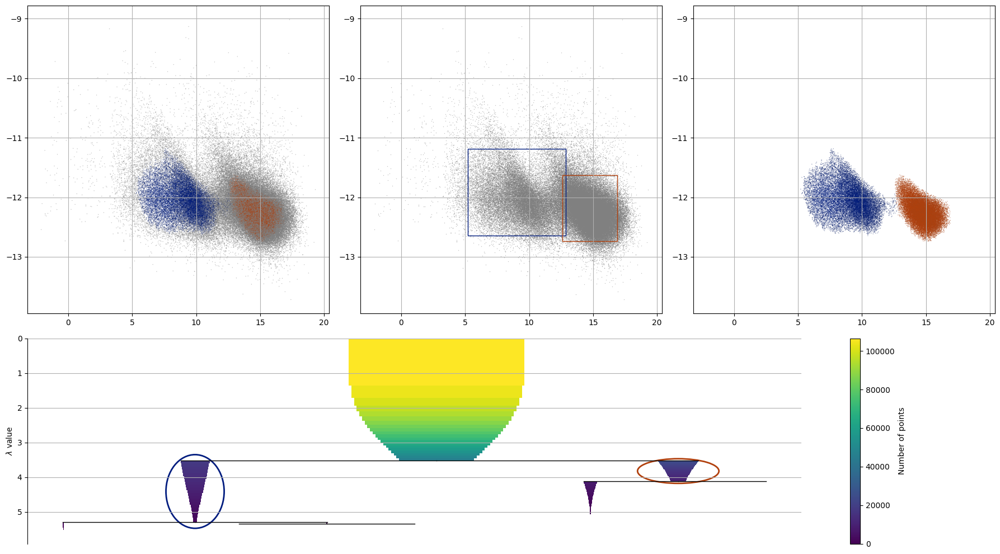

In [53]:
do_cluster(data, plot_dims=(0, 4), min_cluster_size=100)

Found 2 clusters


HDBSCAN(approx_min_span_tree=False, min_cluster_size=100)

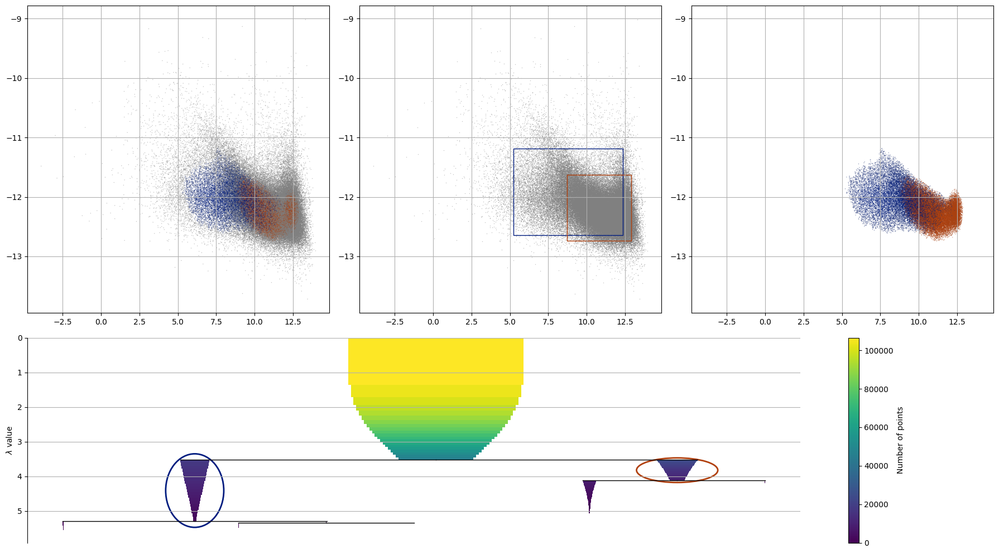

In [54]:
do_cluster(data, plot_dims=(2, 4), min_cluster_size=100)